# Demo Run

In [1]:
# %load_ext autoreload
# %autoreload 2
# # # this may cause DisentenglementTargetManager to reimported, losing all the data e.g. configurations.

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

In [3]:
import warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)

    import os
    import sys
    import gc
    import warnings
    import anndata as ad
    import scanpy as sc
    import copy
    import torch
    from pathlib import Path
    import networkx as nx
    from sklearn.neighbors import kneighbors_graph
    import numpy as np
    import rapids_singlecell as rsc
    import scanpy as sc
    import cupyx as cpx
    import pandas as pd
    import numpy as np
    import scipy.stats
    import statsmodels.api as sm
    from statsmodels.formula.api import ols
    import scib
    import scib_metrics
    
    sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
    import tardis
    tardis.config = tardis.config_server
    
    sc.settings.verbosity = 3
    
    print(f"CUDA used: {torch.cuda.is_available()}")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_na

CUDA used: True


/home/icb/kemal.inecik/work/codes/tardis/tardis/_disentenglementtargetconfigurations.py:30: PydanticDeprecatedSince20: Pydantic V1 style `@validator` validators are deprecated. You should migrate to Pydantic V2 style `@field_validator` validators, see the migration guide for more details. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.1.1/migration/
  @validator("non_categorical_coefficient_method", always=True)


In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'
    layers: 'counts'

In [5]:
adata.X = adata.layers["counts"].copy()
del adata.layers
gc.collect()

1538

## Train

In [6]:
warmup_epoch_range = [6, 72]
# _, n_epochs_kl_warmup = warmup_epoch_range
n_epochs_kl_warmup = 400

counteractive_minibatch_settings = dict(
    method="categorical_random",
    method_kwargs=dict(
        within_labels=False,
        within_batch=False,
        within_categorical_covs=None,
        seed="forward",
    ),
)

disentanglement_targets_configurations = [
    dict(
        obs_key="condition",
        n_reserved_latent=24,
        counteractive_minibatch_settings=counteractive_minibatch_settings,
        losses=[
            dict(
                target_type="categorical",
                progress_bar=True,
                weight=480,
                method="mse",
                latent_group="reserved",
                is_minimized=False,
                transformation="inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                target_type="categorical",
                progress_bar=True,
                weight=30,
                method="mse",
                latent_group="reserved",
                is_minimized=True,
                transformation="none",
                warmup_period=warmup_epoch_range,
                method_kwargs={},
            ),
        ],
    ),
]

model_params = dict(
    n_hidden=512,
    n_layers=3,
    n_latent=48,
    gene_likelihood="nb",
    use_batch_norm="none",
    use_layer_norm="both",
    dropout_rate=0.1,
    include_auxillary_loss=True,
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs=dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    ),
)

dataset_params = dict(
    layer=None,
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentanglement_targets_configurations=disentanglement_targets_configurations,
)

tardis.MyModel.setup_anndata(adata, **dataset_params)

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    ),
)

vae = tardis.MyModel(adata, **model_params)
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    vae.train(**train_params)

CUDA backend failed to initialize: Unable to use CUDA because of the following issues with CUDA components:
Outdated CUDA installation found.
Version JAX was built against: 11080
Minimum supported: 12010
Installed version: 11080
The local installation version must be no lower than 12010.
--------------------------------------------------
Outdated cuDNN installation found.
Version JAX was built against: 8907
Minimum supported: 8900
Installed version: 8700
The local installation version must be no lower than 8900.
--------------------------------------------------
Outdated cuBLAS installation found.
Version JAX was built against: 111103
Minimum supported: 120100
Installed version: 111103
The local installation version must be no lower than 120100.
--------------------------------------------------
Outdated cuSPARSE installation found.
Version JAX was built against: 11705
Minimum supported: 12100
Installed version: 11705
The local installation version must be no lower than 12100. (Set TF_

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_exploration_runs
ID: dph0i9i4
Name: swift-universe-3
Tags: tardis, exploration
Notes: Development runs for tardis.
URL: https://wandb.ai/inecik-academic/tardis_exploration_runs/runs/dph0i9i4
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240420_141011-dph0i9i4/files



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-b0a94014-449c-583c-8c16-b9e11db18f44,MIG-5f262479-5840-557f-a3a2-990375d2e18b]
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal hand

Epoch 1/1000:   0%|                                                                                                                                | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:63: UserWarning: Possible group definition indices are calculating for `condition` for `training` set.
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractiveminibatchgenerator.py:63: UserWarning: Number of elements in each group for `condition` in `training` set: 212,385,442,183,417,293,555,138,478,372,432,364,249,288,49,207,448,299,269,545,238,278,140,48,330,150,106,290,106,87,180,206,57,334,237,165,259,151,92,196,379,434,325,966,139,363,175,181,282,330,227,146,385,255,263,383,319,616,308,305,237,585,244,134,254,347,287,732,353,367,258,359,351,372,132,229,222,149,58,119,196,504,302,291,338,210,154,236,386,163,134,105,273,378,147,170,457,79,154,293,179,357,100,242,194,214,325,138,148,286,285,112,112,352,347,351,257,45,49,211,218,257,75,211,324,244,204,243,283,212,955,256,202,520,317,165,502,364,490,472,216,440,453,284,374,228,369,248

Epoch 690/1000:  69%|▋| 689/1000 [1:40:25<44:54,  8.66s/it, v_num=i4_1, total_loss_train=1.28e+3, kl_local_train=43.8, tardis_condition_0_train=93.4, tardis_condition_1_tra

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:53: Detected KeyboardInterrupt, attempting graceful shutdown...


W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "run10"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [39]:
adata.obs

,cov_drug_dose_name,dose_val,control,condition,guide_identity,drug_dose_name,cell_type,split,split1,split2,...,split18,split19,split20,split21,split22,split23,split24,split25,_scvi_batch,_scvi_labels
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAAGAAGC-1,A549_ctrl_1,1,1,ctrl,NegCtrl0_NegCtrl0__NegCtrl0_NegCtrl0,ctrl_1,A549,train,train,train,...,train,train,train,train,train,train,train,train,0,0
AAACCTGAGGCATGTG-1,A549_TSC22D1+ctrl_1+1,1+1,0,TSC22D1+ctrl,TSC22D1_NegCtrl0__TSC22D1_NegCtrl0,TSC22D1+ctrl_1+1,A549,train,train,train,...,train,train,train,train,train,train,train,train,0,0
AAACCTGAGGCCCTTG-1,A549_KLF1+MAP2K6_1+1,1+1,0,KLF1+MAP2K6,KLF1_MAP2K6__KLF1_MAP2K6,KLF1+MAP2K6_1+1,A549,train,train,train,...,ood,ood,ood,train,train,ood,train,train,0,0
AAACCTGCACGAAGCA-1,A549_ctrl_1,1,1,ctrl,NegCtrl10_NegCtrl0__NegCtrl10_NegCtrl0,ctrl_1,A549,train,test,train,...,train,train,train,train,train,train,test,test,0,0
AAACCTGCAGACGTAG-1,A549_CEBPE+RUNX1T1_1+1,1+1,0,CEBPE+RUNX1T1,CEBPE_RUNX1T1__CEBPE_RUNX1T1,CEBPE+RUNX1T1_1+1,A549,train,train,train,...,train,train,train,train,train,ood,train,train,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCAGTACGT-8,A549_FOXA3+ctrl_1+1,1+1,0,FOXA3+ctrl,FOXA3_NegCtrl0__FOXA3_NegCtrl0,FOXA3+ctrl_1+1,A549,test,test,test,...,test,train,train,train,test,train,train,train,0,0
TTTGTCATCCACTCCA-8,A549_CELF2+ctrl_1+1,1+1,0,CELF2+ctrl,CELF2_NegCtrl0__CELF2_NegCtrl0,CELF2+ctrl_1+1,A549,train,train,train,...,train,test,train,train,train,train,train,train,0,0
TTTGTCATCCCAACGG-8,A549_BCORL1+ctrl_1+1,1+1,0,BCORL1+ctrl,BCORL1_NegCtrl0__BCORL1_NegCtrl0,BCORL1+ctrl_1+1,A549,train,test,train,...,train,train,train,train,train,train,train,train,0,0


## Load Model

In [8]:
# dir_path = os.path.join(
#     tardis.config.io_directories["models"],
#     "run7"
# )
# vae = tardis.MyModel.load(dir_path, adata=adata)

## Check training

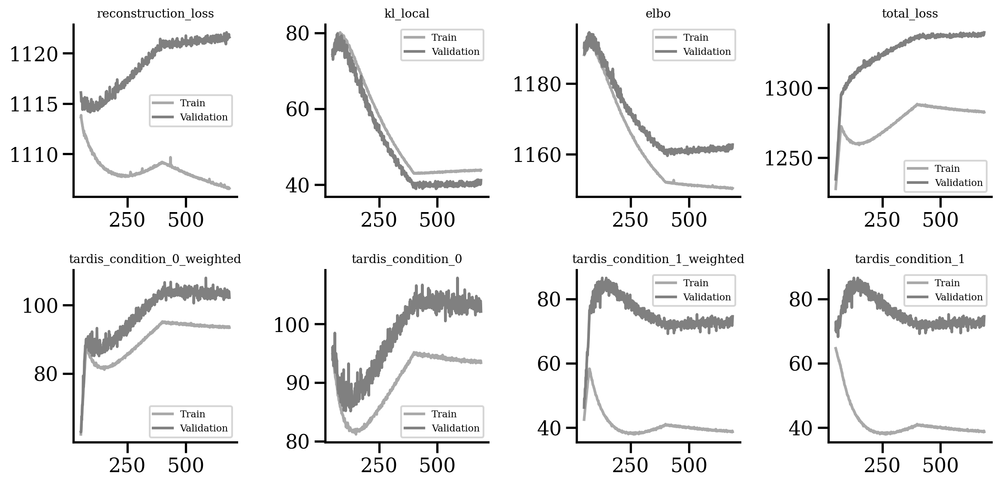

In [9]:
vae.plot_training_history(
    ignore_first=50, 
    n_col=4,
    metrics_name=[
        "reconstruction_loss", "kl_local", "elbo", "total_loss",
        #
        "tardis_condition_0_weighted", 
        "tardis_condition_0",
        "tardis_condition_1_weighted", 
        "tardis_condition_1",
    ]
)

In [10]:
# from tardis._disentenglementtargetmanager import DisentenglementTargetManager
# display(np.array(DisentenglementTargetManager.configurations.get_by_obs_key("age").reserved_latent_indices))
# display(np.array(DisentenglementTargetManager.configurations.get_by_obs_key("sex").reserved_latent_indices))

In [11]:
# vae.plot_latent_kde(
#     adata_obs=adata.obs,
#     target_obs_key="sex",
#     latent_representation=vae.get_latent_representation(),
#     latent_dim_of_interest=None
# )

# Metrics

In [13]:
batch_size_vae_metrics = 512
vae_metrics = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size_vae_metrics)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size_vae_metrics).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    # "r2_train_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    # "r2_train_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
    # "r2_validation_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
    # "r2_validation_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
}
for k, v in vae_metrics.items():
    print(k, v)

reconstruction_error -1105.845229879628
elbo -1149.023193359375
r2_train 0.9996511314114191
r2_validation 0.9996674282104349


# Visualization

In [14]:
def prepare(ad_latent):
    sc.pp.neighbors(ad_latent, n_neighbors = 30)
    sc.tl.umap(ad_latent)

In [15]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
prepare(latent)
latent

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:50)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:38)


AnnData object with n_obs × n_vars = 108497 × 48
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25', '_scvi_batch', '_scvi_labels'
    uns: 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

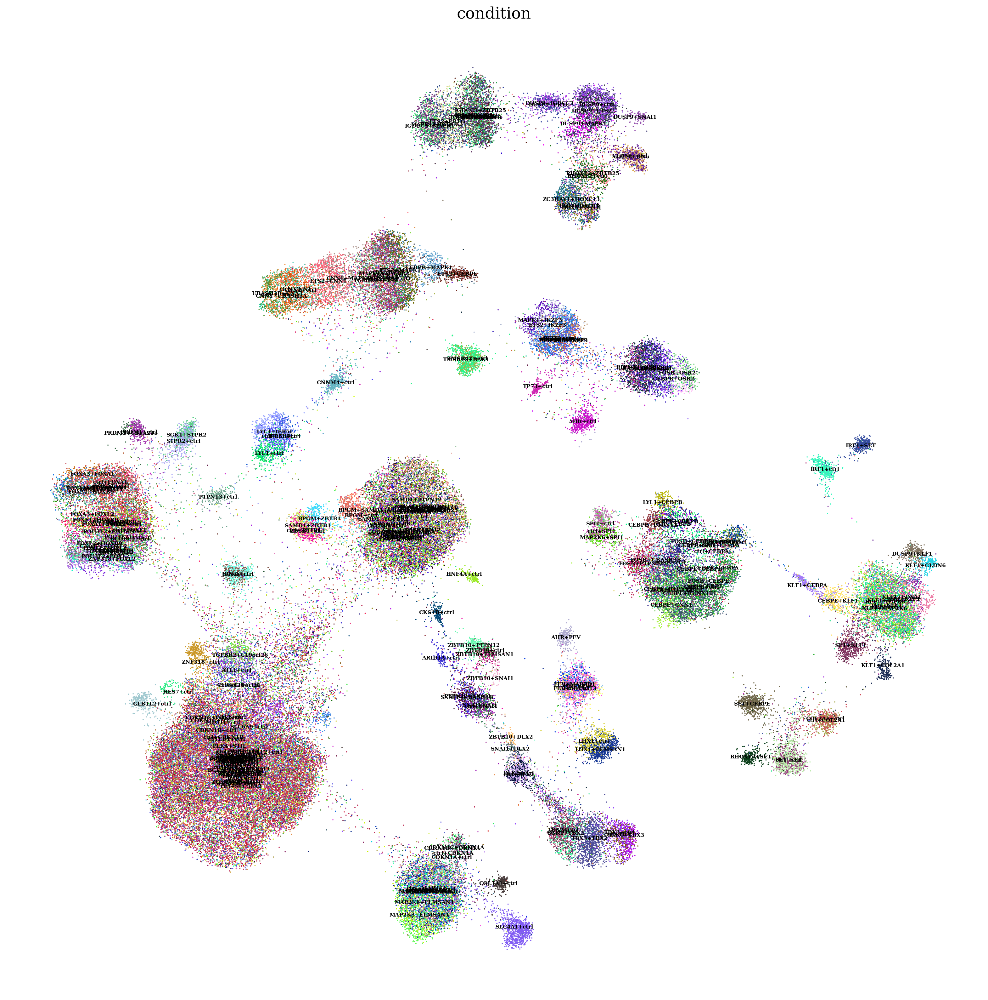

In [16]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [23]:
del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:31)


(108497, 24)

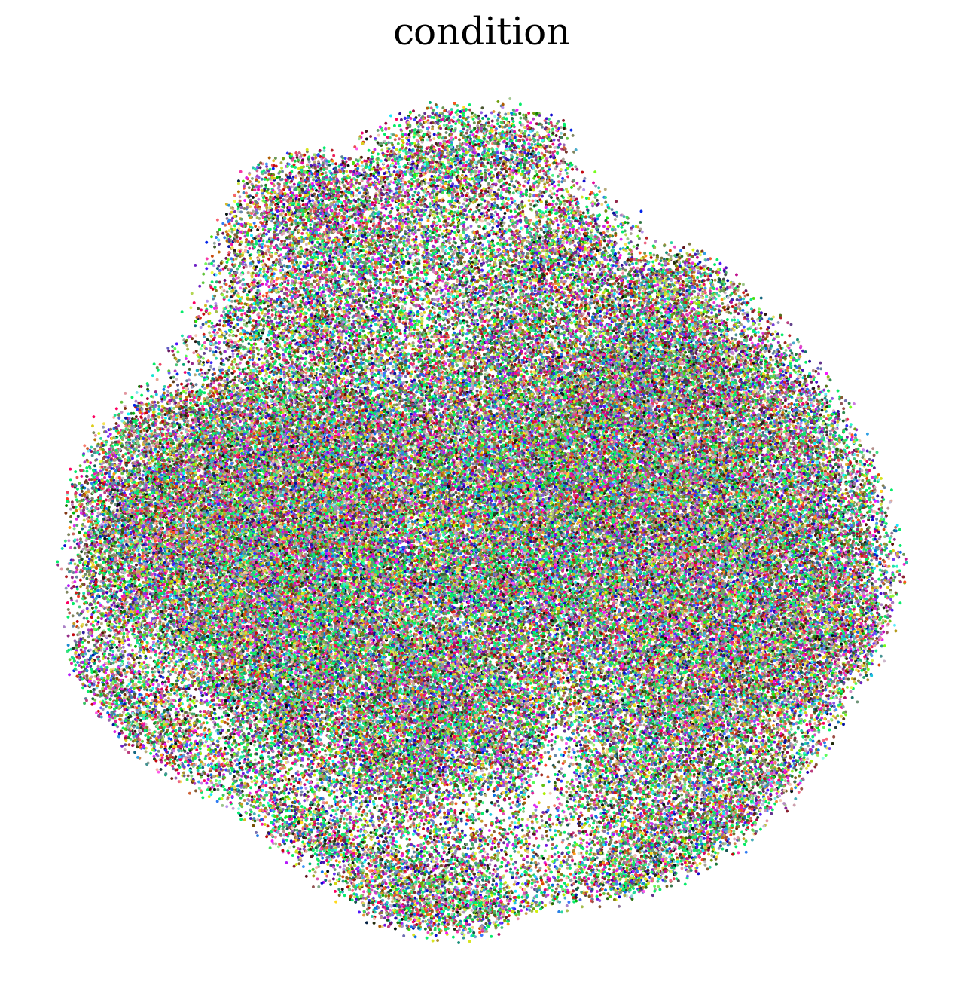

In [32]:
# unreserved latent
# as it is cultured single cells, no real variation is expected anyways

from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(8, 8))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc=None,
        ax=plt.gca(),
    show=False
    )
plt.show()

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:43)


(108497, 24)

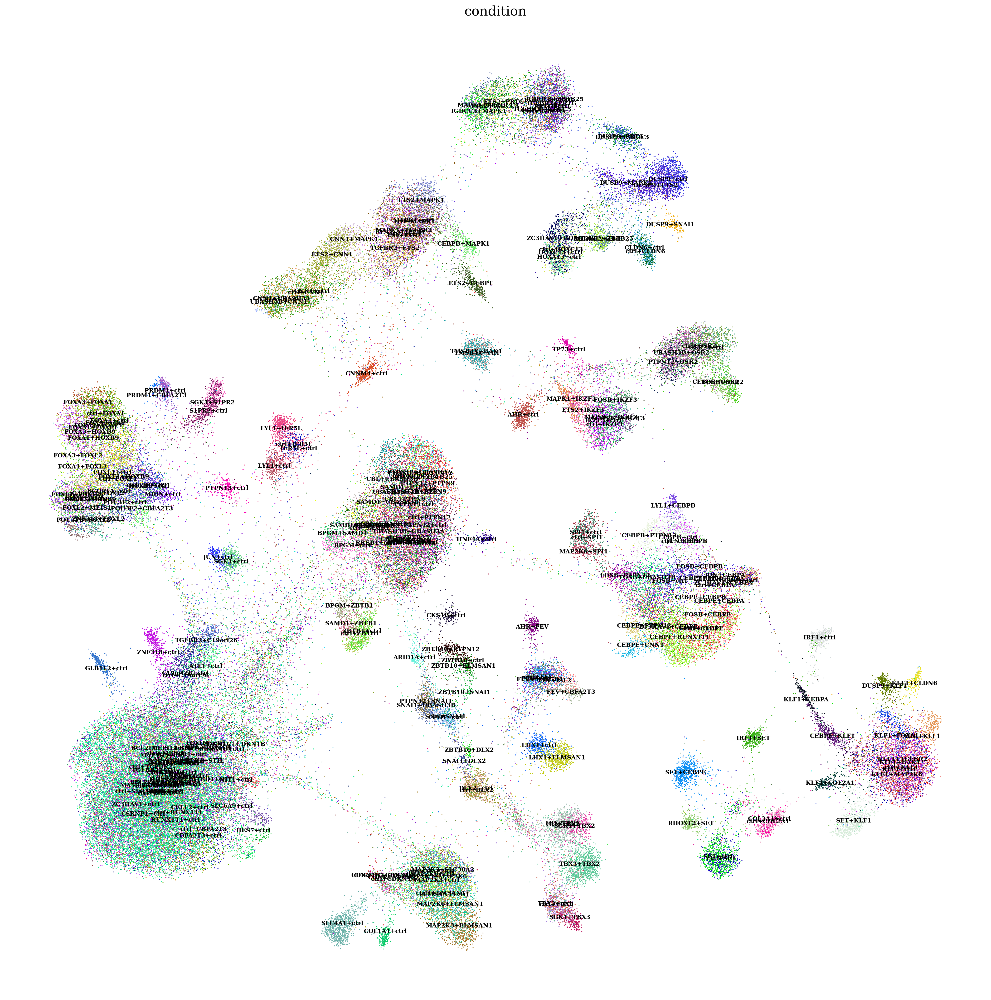

In [33]:
# reserved latent

from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(24, 24))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=8,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

del latent
gc.collect();

computing neighbors
    using data matrix X directly


/tmp/ipykernel_1456128/4249819417.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  latent.obs["real_control"][latent.obs["real_control"] == 0] = np.nan


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:46)


(108497, 24)

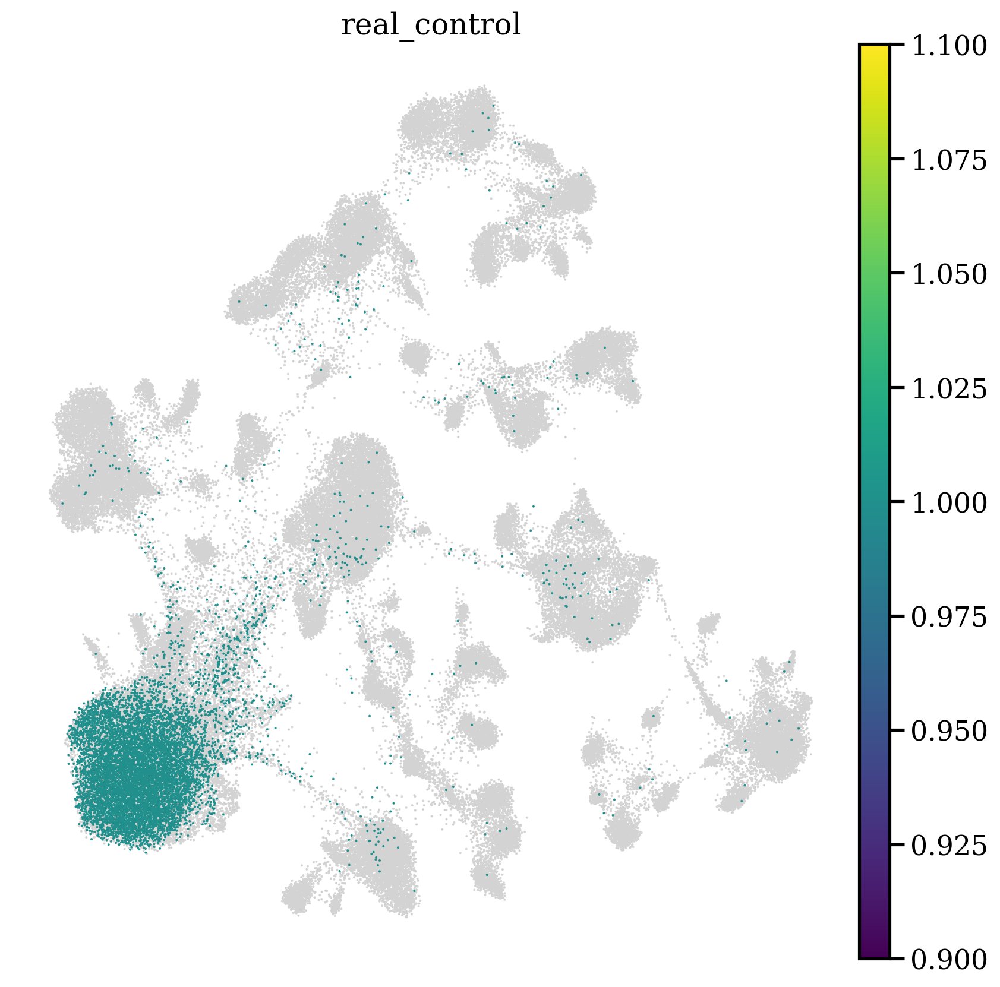

In [38]:
# reserved latent
# untreated colored.

from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
latent.obs["real_control"] = (latent.obs["condition"] == "ctrl").astype(int)
latent.obs["real_control"][latent.obs["real_control"] == 0] = np.nan
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(10, 10))
    sc.pl.umap(
        latent, 
        color=["real_control"], 
        ncols=1,
        size=8,
        frameon=False,
        legend_loc="on data",
        legend_fontsize=8,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:59)


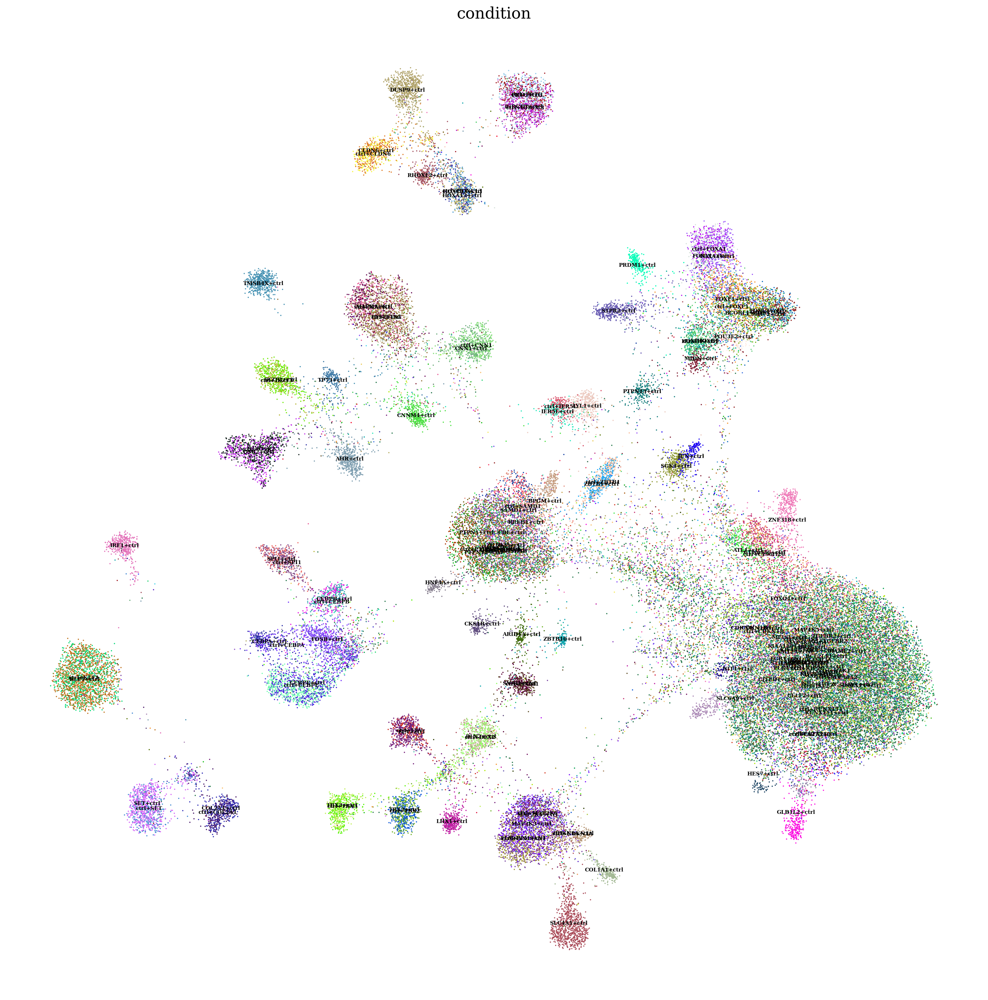

In [34]:
# reserved latent
# only control or single perturbations

from tardis._disentenglementtargetmanager import DisentenglementTargetManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentenglementTargetManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
latent = latent[latent.obs["condition"].astype(str).str.contains("ctrl")]
prepare(latent)

def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()